# Setup

In [1]:
# Import libraries
%matplotlib inline
import sys
import os
from dotenv import load_dotenv
import numpy as np
from torch.utils.data import Dataset
from PIL import Image
import matplotlib.pyplot as plt

load_dotenv()
sys.path.append(os.getenv('CODE_ROOT_PATH')) # Add path

from src.visualization.visualization_utility import generate_image

NN_PATH = os.getenv('NN_PATH')
PREPROCESSED_DATA_DIR = os.getenv('PREPROCESSED_DATA_DIR')

# RIS on Houses (Figure 1, p. 1)

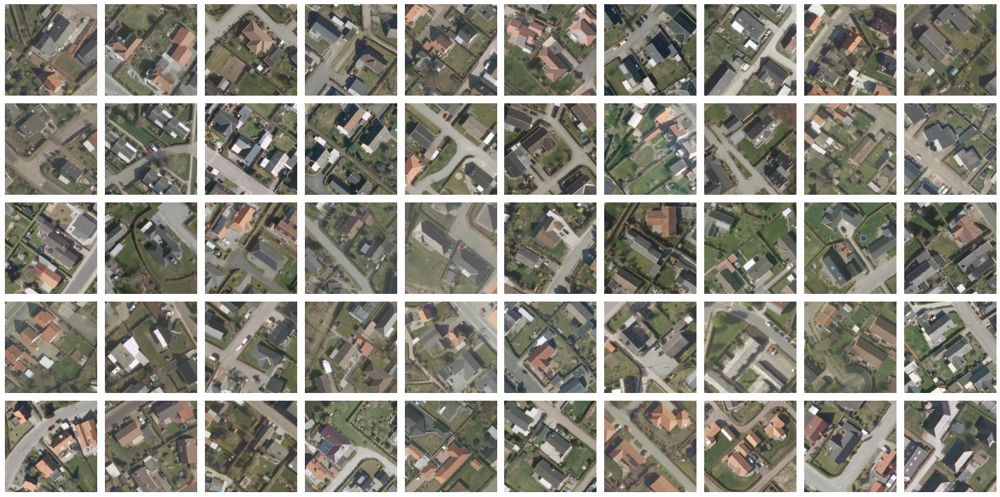

In [2]:
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'tiny', 'nn_medium_candidates.npy'))[5]
example_paths = [os.path.join(PREPROCESSED_DATA_DIR, str(nn_candidates[i])+'.npy') for i in range(50)]
generate_image(example_paths, num_rows=5, num_cols=10, out_file=os.path.join(os.getenv('FIGURES_DIR'), 'nearest_neighbors', 'houses_nn.png'))

# Four Nearest Neighbors of all `Easy` Patches (Figure 18, p. 38)

In [3]:
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'small', 'nn_easy_candidates.npy'))
mapped_indices = [nn_candidates[0][:5]]
mapped_indices = np.append(mapped_indices, nn_candidates[1][:5])
mapped_indices = np.append(mapped_indices, nn_candidates[2][:5])
mapped_indices = np.append(mapped_indices, nn_candidates[3][:5])
mapped_indices = np.append(mapped_indices, nn_candidates[4][:5])
mapped_indices = np.append(mapped_indices, nn_candidates[5][:5])
mapped_indices = np.append(mapped_indices, nn_candidates[6][:5])
mapped_indices = np.append(mapped_indices, nn_candidates[7][:5])
mapped_indices = np.append(mapped_indices, nn_candidates[8][:5])
mapped_indices = np.append(mapped_indices, nn_candidates[9][:5])

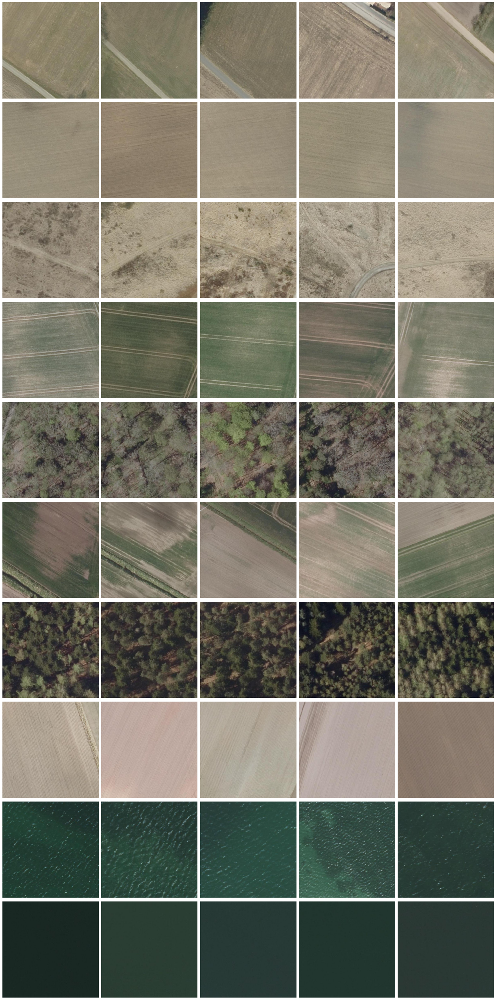

In [4]:
paths = [os.path.join(PREPROCESSED_DATA_DIR, str(mapped_indices[i])+'.npy') for i in range(len(mapped_indices))]
generate_image(paths, num_rows=int(len(mapped_indices)/5), num_cols=5, out_file=os.path.join(os.getenv("FIGURES_DIR"), 'nearest_neighbors', 'easy_top_results.png'))

# Selected Nearest Neighbors of Harder Patches (Figure 19, p. 39)

In [5]:
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'tiny', 'nn_medium_candidates.npy'))
mapped_indices = [nn_candidates[3][i] for i in [0,1,6,11,17]]                              # Farms
mapped_indices = np.append(mapped_indices, [nn_candidates[1][i] for i in [0,1,5,9,12]])    # Small river
mapped_indices = np.append(mapped_indices, [nn_candidates[10][i] for i in [0,2,5,10,15]])  # Factory hall
mapped_indices = np.append(mapped_indices, [nn_candidates[8][i] for i in [0, 5, 9, 14, 20]]) # Road markings
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'small', 'nn_hard_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[0][i] for i in [0,8,9,12,14]])   # Rails
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'tiny', 'nn_hard_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[2][i] for i in [0,18]])          # Animals
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'small_pretrained', 'nn_hard_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[2][i] for i in [11,16,2]])       # Animals
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'small', 'nn_hard_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[8][i] for i in [0,7,17,13,16]]) # Soccer field
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'tiny', 'nn_medium_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[11][i] for i in [0,2,7,10,13]])        # Interesting texture
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'small_pretrained', 'nn_hard_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[9][i] for i in [0,3,8,9]])      # Boat on water

nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'tiny', 'nn_hard_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[9][i] for i in [19]])           # Boat on water

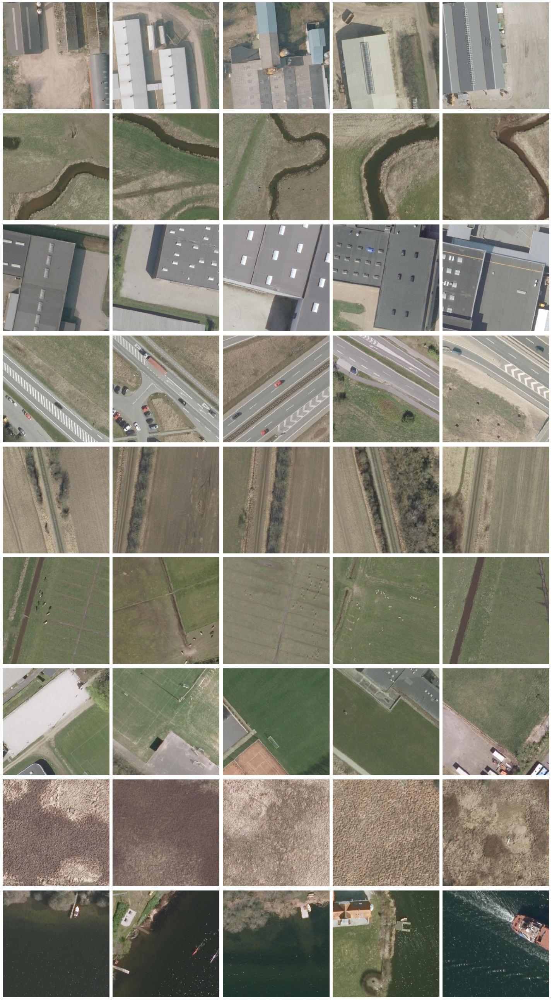

In [6]:
paths = [os.path.join(PREPROCESSED_DATA_DIR, str(mapped_indices[i])+'.npy') for i in range(len(mapped_indices))]
generate_image(paths, num_rows=int(len(mapped_indices)/5), num_cols=5, out_file=os.path.join(os.getenv("FIGURES_DIR"), 'nearest_neighbors', 'hard_results.png'))

# Selected False Positives (Figure 20, p. 40)

In [7]:
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'small', 'nn_medium_candidates.npy'))
mapped_indices = [nn_candidates[9][i] for i in [0, 1, 4, 7, 22]]  # Worng abstraction: cars instead of containers
mapped_indices = np.append(mapped_indices, [nn_candidates[2][i] for i in [0, 14, 19, 21, 33]])  # Wrong abstraction: dirt road instead of country road
mapped_indices = np.append(mapped_indices, [nn_candidates[7][i] for i in [0, 10, 13, 15, 19]])  # Missing detail: to few trees, not in cluster
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'tiny', 'nn_medium_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[8][i] for i in [0, 2, 3, 6, 19]])  # Missing detail: road without road markings
mapped_indices = np.append(mapped_indices, [nn_candidates[6][i] for i in [0, 31]])
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'tiny_longer', 'nn_medium_candidates.npy'))
mapped_indices = np.append(mapped_indices, nn_candidates[6][38])
nn_candidates_2 = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'small_pretrained', 'nn_medium_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates_2[6][i] for i in [7, 18]])
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'tiny', 'nn_medium_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[12][i] for i in [0, 4, 8, 21, 41]])
mapped_indices = np.append(mapped_indices, [nn_candidates[13][i] for i in [0, 8, 34, 44, 33]])
mapped_indices = np.append(mapped_indices, [nn_candidates[16][i] for i in [0, 13, 14, 45, 34]])
nn_candidates = np.load(os.path.join(os.getenv('TRAINED_MODELS'), 'small', 'nn_hard_candidates.npy'))
mapped_indices = np.append(mapped_indices, [nn_candidates[9][i] for i in [0, 13, 14, 15, 2]])

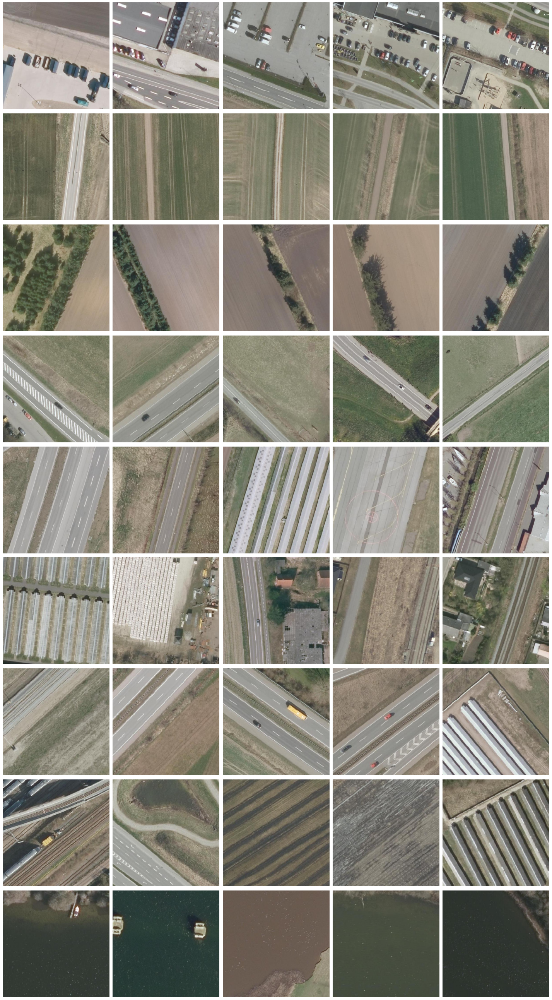

In [8]:
paths = [os.path.join(PREPROCESSED_DATA_DIR, str(mapped_indices[i])+'.npy') for i in range(len(mapped_indices))]
generate_image(paths, num_rows=int(len(mapped_indices)/5), num_cols=5, out_file=os.path.join(os.getenv("FIGURES_DIR"), 'nearest_neighbors', 'fp_results.png'))